In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

import jax.numpy as jnp
from jax import random, vmap, pmap, local_devices
from jax import pmap, local_devices, local_device_count, process_index, device_get
from jax import image

from tqdm.auto import trange

from models import VAE
from archs import MLP, periodic_encoding
from utils import restore_checkpoint

from configs.default import get_config

import matplotlib.pyplot as plt
# from matplotlib import style
# style.use('dark_background')
%matplotlib inline

print(local_devices())

2023-01-25 15:27:46.749355: E tensorflow/tsl/lib/monitoring/collection_registry.cc:81] Cannot register 2 metrics with the same name: /tensorflow/core/bfc_allocator_delay


[StreamExecutorGpuDevice(id=0, process_index=0, slice_index=0)]


In [2]:
plt.rcParams.update(plt.rcParamsDefault)
plt.rc('font', family='serif')
plt.rcParams.update({
                      "text.usetex": True,
                      "font.family": "serif",
                      'text.latex.preamble': r'\usepackage{amsmath}',
                      'font.size': 20,
                      'lines.linewidth': 3,
                      'axes.labelsize': 22,  
                      'axes.titlesize': 24,
                      'xtick.labelsize': 20,
                      'ytick.labelsize': 20,
                      'legend.fontsize': 20,
                      'axes.linewidth': 2})

In [3]:
volcano_data = jnp.load('../datasets/volcano.npy')
N, m, _, num_channels = volcano_data.shape

def get_example(u, X, n):
    s = u.reshape(-1,num_channels)
    return u, X, s, jnp.tile(1.0, (X.shape[0],1))

x = jnp.linspace(0,1,m)
y = jnp.linspace(0,1,m)
grid = jnp.meshgrid(x,y)
X = jnp.array(grid).T.reshape(-1,2)

gen_fn = lambda u: get_example(u, X, m)

# Generate training samples
gen_fn = lambda u: get_example(u, X, m)
u_train, y_train, s_train, w_train = vmap(gen_fn)(volcano_data)
print('Training data')
print('u: {}'.format(u_train.shape))
print('y: {}'.format(y_train.shape))
print('s: {}'.format(s_train.shape))
print('w: {}'.format(w_train.shape))

Training data
u: (4096, 128, 128, 2)
y: (4096, 16384, 2)
s: (4096, 16384, 2)
w: (4096, 16384, 1)


In [4]:
print(volcano_data[...,1].min())
print(volcano_data[...,1].max())

-1.0
1.0


In [5]:
# Load trained model
config = get_config()
model = VAE(config)
model = restore_checkpoint(model, '../checkpoints/volcano_h512_eps256_beta1e-4_checkpoint_25000') # with RWF for Conv


                             NeuralOperator Summary                             
┏━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ path          ┃ module        ┃ inputs        ┃ outputs      ┃ params        ┃
┡━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│               │ NeuralOperat… │ -             │ float32[1,2] │               │
│               │               │ float32[1,12… │              │               │
│               │               │ -             │              │               │
│               │               │ float32[1,2]  │              │               │
│               │               │ -             │              │               │
│               │               │ float32[256]  │              │               │
├───────────────┼───────────────┼───────────────┼──────────────┼───────────────┤
│ encoder       │ ConvEncoder   │ -             │ -            │               │
│               │          

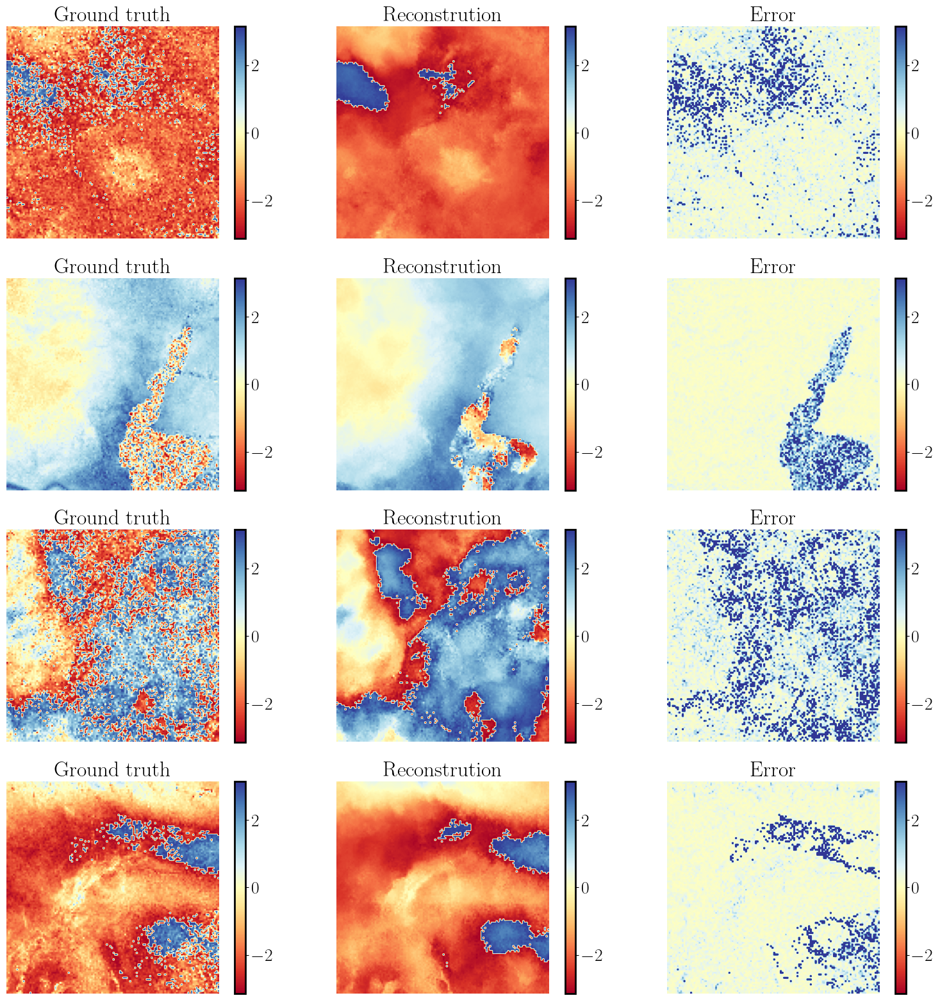

In [6]:
# Train reconstructions
num_samples = 4
key = random.PRNGKey(4321)
idx = random.choice(key, N, (num_samples,), replace=False)
eps_train = random.normal(key, (u_train.shape[0], config.eps_dim))
pred_fn = lambda params: model.state.apply_fn(params, u_train[idx,...], y_train[idx,...], eps_train[idx,...])
s_pred = pmap(pred_fn)(model.state.params)[0,...]

# error_fn = lambda target, output: jnp.linalg.norm(target-output,2)/jnp.linalg.norm(target,2)
# error = vmap(error_fn, in_axes=(0,0))(s_test, s_pred)
# print('Relative L2 error: {:.2e}'.format(jnp.mean(error)))

volcano_samples = s_train.reshape(N,m,m,2)
vano_samples = s_pred.reshape(num_samples,m,m,2)

plt.figure(figsize=(16,16))
cnt=0
for i in range(num_samples):
    # Ground truth
    cnt+=1
    plt.subplot(num_samples, 3, cnt)
    phase = jnp.arctan2(volcano_samples[idx[i],...,1], volcano_samples[idx[i],...,0])
    phase_gt = (phase + jnp.pi) % (2 * jnp.pi) - jnp.pi
    plt.imshow(phase_gt,  cmap='RdYlBu', vmin = -jnp.pi, vmax=jnp.pi, interpolation=None)
    # plt.pcolor(grid[0], grid[1], s_train[idx[i],...,-1].reshape(m,m), shading='auto')
    plt.axis('off')
    plt.colorbar()
    plt.title('Ground truth')
    # Prediction
    cnt+=1
    plt.subplot(num_samples, 3, cnt)
    phase = jnp.arctan2(vano_samples[i,...,1], vano_samples[i,...,0])
    phase_vn = (phase + jnp.pi) % (2 * jnp.pi) - jnp.pi
    plt.imshow(phase_vn,  cmap='RdYlBu', vmin = -jnp.pi, vmax=jnp.pi, interpolation=None)

    # plt.pcolor(grid[0], grid[1], s_pred[i,...,-1].reshape(m,m), shading='auto')
    plt.axis('off')
    plt.colorbar()
    plt.title('Reconstrution')
    # Error
    cnt+=1
    plt.subplot(num_samples, 3, cnt)
    error = jnp.abs(phase_gt-phase_vn)
    plt.imshow(error,  cmap='RdYlBu', vmin = -jnp.pi, vmax=jnp.pi, interpolation=None)
    # plt.pcolor(grid[0], grid[1], error, shading='auto')
    plt.axis('off')
    plt.colorbar()
    plt.title('Error')
plt.tight_layout()
plt.savefig('./figures/test_reconstructions.png', dpi=300)
plt.show()

In [7]:
# Generate samples
batch_size = 32
num_devices = local_device_count()
num_steps = N // (batch_size*num_devices)
sample_fn = lambda params, eps: model.state.decode_fn(params, eps, y_train[:batch_size,...])

vano_samples = []
for i in trange(num_steps):
    key = random.PRNGKey(i)
    eps_test = random.normal(key, (num_devices, batch_size, config.eps_dim))
    vano_samples.append(pmap(sample_fn, in_axes=(0,0))(model.state.params, eps_test))
    
vano_samples = jnp.array(vano_samples).reshape(N,m,m,num_channels)
print(vano_samples.shape)

  0%|          | 0/128 [00:00<?, ?it/s]

(4096, 128, 128, 2)


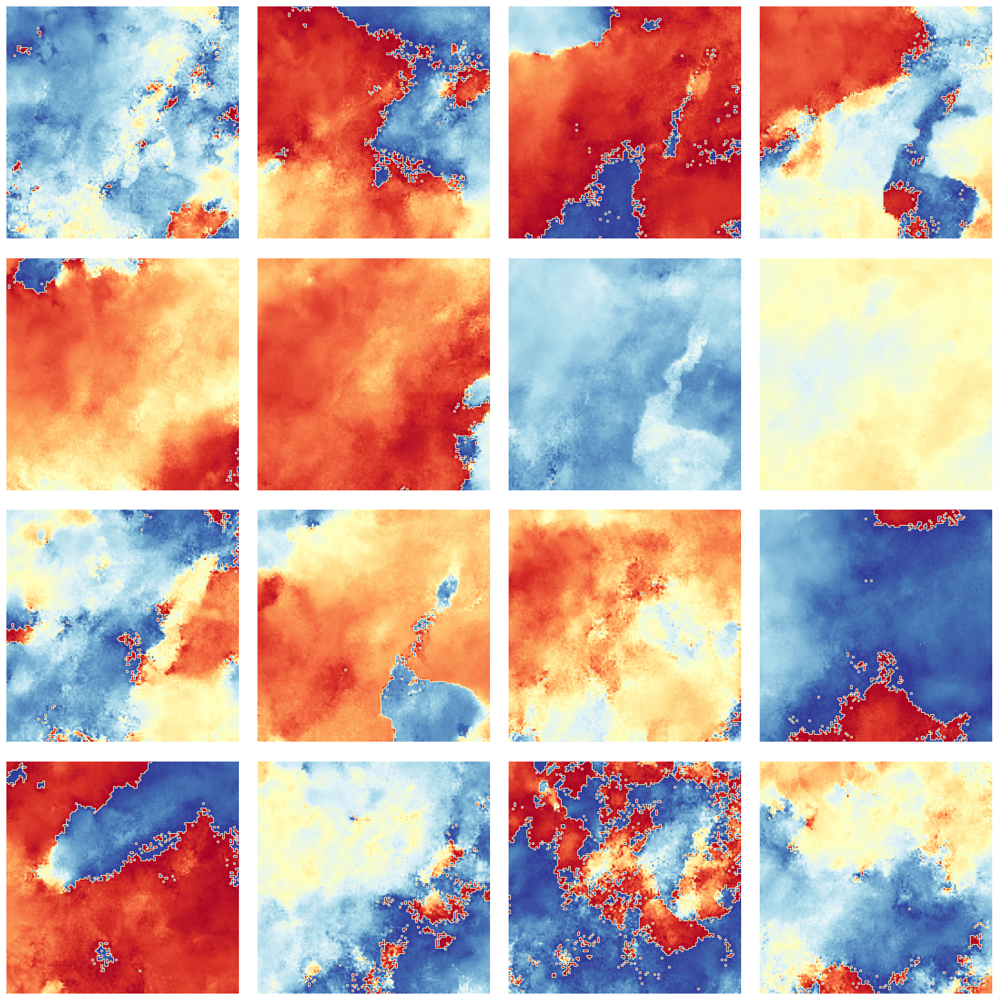

In [8]:
# Plot VANO samples
num_samples = 16
idx = random.choice(random.PRNGKey(0), vano_samples.shape[0], (num_samples,), replace=False)

plt.figure(figsize=(16, 16))
cnt = 0
for i in range(num_samples):
    cnt += 1
    plt.subplot(4, 4, cnt)
    phase = jnp.arctan2(vano_samples[idx[i],...,1], vano_samples[idx[i],...,0])
    phase = (phase + jnp.pi) % (2 * jnp.pi) - jnp.pi
    plt.imshow(phase,  cmap='RdYlBu', vmin = -jnp.pi, vmax=jnp.pi, interpolation=None)
    plt.axis('off')


plt.tight_layout()
plt.savefig('./figures/vano_samples.png', dpi=300)
plt.show()

In [9]:
# Load GANO samples
gano_samples = jnp.load('../datasets/GANO_samples.npy')
resize = lambda x: image.resize(x, shape=(m,m,num_channels), method='bilinear')

gano_samples = jnp.array(gano_samples)
gano_samples = vmap(resize)(gano_samples)

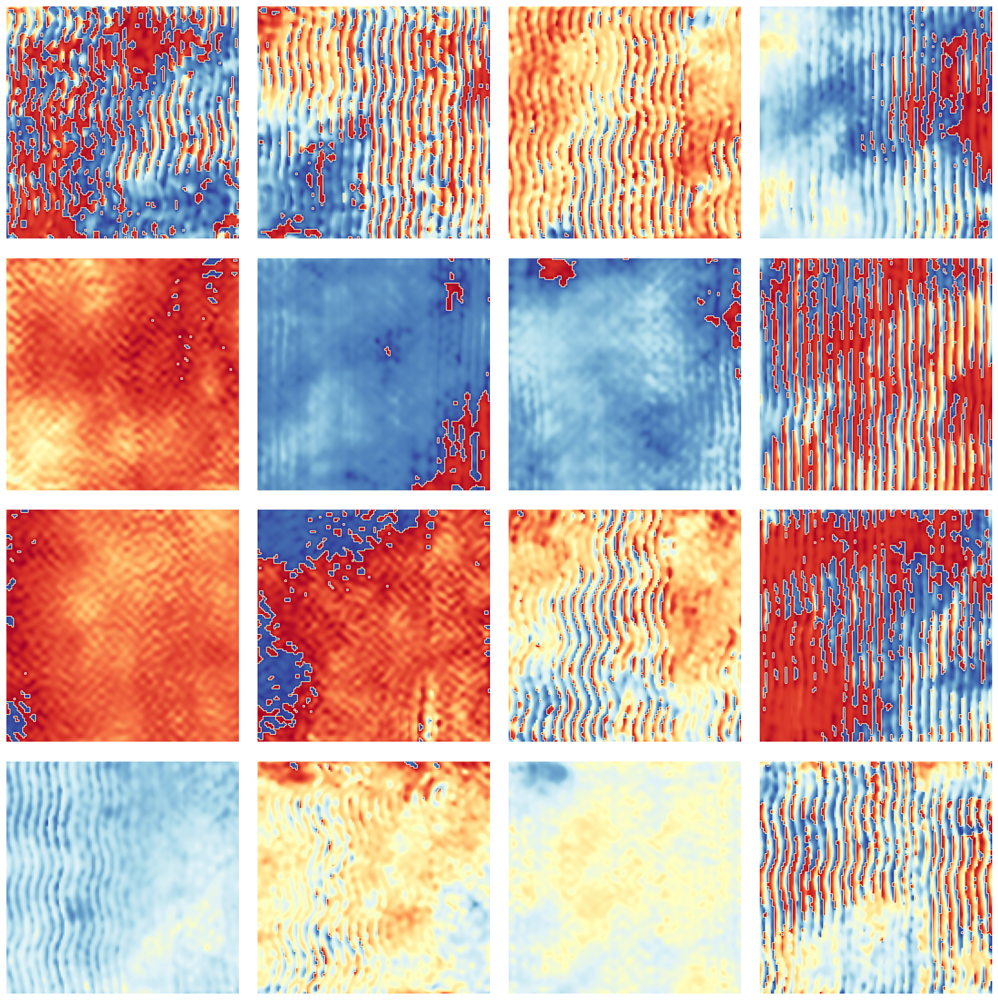

In [10]:
# Plot GANO samples
num_samples = 16
idx = random.choice(random.PRNGKey(0), gano_samples.shape[0], (num_samples,), replace=False)

plt.figure(figsize=(16, 16))
cnt = 0
for i in range(num_samples):
    cnt += 1
    plt.subplot(4, 4, cnt)
    phase = jnp.arctan2(gano_samples[idx[i],...,1], gano_samples[idx[i],...,0])
    phase = (phase + jnp.pi) % (2 * jnp.pi) - jnp.pi
    plt.imshow(phase,  cmap='RdYlBu', vmin = -jnp.pi, vmax=jnp.pi, interpolation=None)
    # plt.pcolor(grid[0], grid[1], gano_samples[idx[i],...,1])
    # plt.colorbar()
    plt.axis('off')


plt.tight_layout()
plt.savefig('./figures/gano_samples.png', dpi=300)
plt.show()

In [13]:
# Generate super-resolution samples
run_idx = 0
key = random.PRNGKey(run_idx)

num_samples = 4
batch_size = 1
num_devices = local_device_count()
num_steps = num_samples // (batch_size*num_devices)

# Super-resolution grid
m = 256
x = jnp.linspace(0,1,m)
y = jnp.linspace(0,1,m)
grid = jnp.meshgrid(x,y)
y_test = jnp.array(grid).T.reshape(1,-1,2)
print(y_test.shape)

sample_fn = lambda params, eps: model.state.decode_fn(params, eps, y_test)

samples = []
for i in trange(num_steps):
    key, subkey = random.split(key)
    eps = random.normal(subkey, (num_devices, batch_size, config.eps_dim))
    samples.append(pmap(sample_fn, in_axes=(0,0))(model.state.params, eps))

vano_samples = jnp.array(samples).reshape(num_samples,256,256,2)


(1, 65536, 2)


  0%|          | 0/4 [00:00<?, ?it/s]

In [14]:
def volcano_phase(samples):
    phase = jnp.arctan2(samples[...,1], samples[...,0])
    phase = (phase + jnp.pi) % (2 * jnp.pi) - jnp.pi
    return phase
    
volcano_data = volcano_phase(volcano_data)
vano_samples = volcano_phase(vano_samples)
gano_samples = volcano_phase(gano_samples)

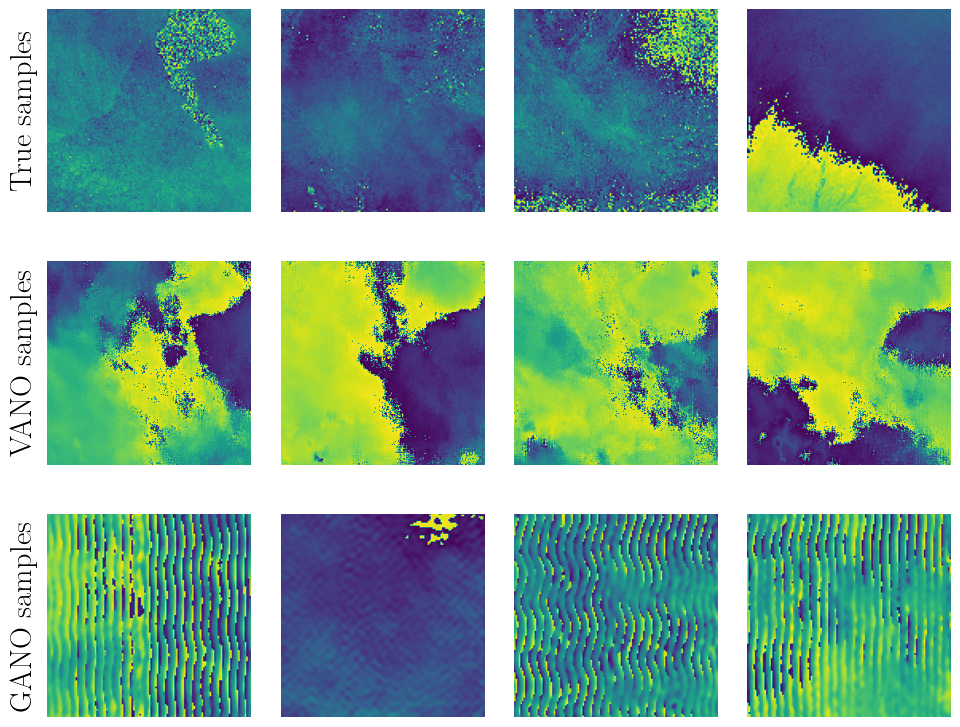

: 

In [19]:
key = random.PRNGKey(12)
idx = random.choice(key, N, (num_samples,), replace=False)

plt.figure(figsize=(10,8))

plt.subplot(3, 4, 1, frameon=False)
plt.imshow(jnp.flipud(volcano_data[idx[0],...]))
plt.ylabel('True samples')
plt.xticks([])
plt.yticks([])

plt.subplot(3, 4, 2)
plt.imshow(jnp.flipud(volcano_data[idx[1],...]))
plt.axis('off')

plt.subplot(3, 4, 3)
plt.imshow(jnp.flipud(volcano_data[idx[2],...]))
plt.axis('off')

plt.subplot(3, 4, 4)
plt.imshow(jnp.flipud(volcano_data[idx[3],...]))
plt.axis('off')

plt.subplot(3, 4, 5, frameon=False)
plt.imshow(jnp.flipud(vano_samples[0,...]))
plt.ylabel('VANO samples')
plt.xticks([])
plt.yticks([])

plt.subplot(3, 4, 6)
plt.imshow(jnp.flipud(vano_samples[1,...]))
plt.axis('off')

plt.subplot(3, 4, 7)
plt.imshow(jnp.flipud(vano_samples[2,...]))
plt.axis('off')

plt.subplot(3, 4, 8)
plt.imshow(jnp.flipud(vano_samples[3,...]))
plt.axis('off')

plt.subplot(3, 4, 9, frameon=False)
plt.imshow(jnp.flipud(gano_samples[idx[0],...]))
plt.ylabel('GANO samples')
plt.xticks([])
plt.yticks([])

plt.subplot(3, 4, 10)
plt.imshow(jnp.flipud(gano_samples[idx[1],...]))
plt.axis('off')

plt.subplot(3, 4, 11)
plt.imshow(jnp.flipud(gano_samples[idx[2],...]))
plt.axis('off')

plt.subplot(3, 4, 12)
plt.imshow(jnp.flipud(gano_samples[idx[3],...]))
plt.axis('off')

# plt.suptitle('Training samples') # or plt.suptitle('Main title')

plt.tight_layout()
plt.savefig('samples_comparison.png', dpi=300, bbox_inches='tight', 
               transparent=True)
plt.show()

In [11]:
def circular_var(x, dim=None):
    #R = torch.sqrt((x.mean(dim=(1,2))**2).sum(dim=1))
    phase = jnp.arctan2(x[:,:,:,1], x[:,:,:,0])
    phase = (phase + jnp.pi) % (2 * jnp.pi) - jnp.pi
    
    C1 = jnp.cos(phase).sum(axis=(1,2))
    S1 = jnp.sin(phase).sum(axis=(1,2))
    R1 = jnp.sqrt(C1**2 + S1**2) / (phase.shape[1]*phase.shape[2])
    return 1 - R1

def circular_skew(x):
    phase = jnp.arctan2(x[:,:,:,1], x[:,:,:,0])
    phase = (phase + jnp.pi) % (2 * jnp.pi) - jnp.pi
    
    C1 = jnp.cos(phase).sum(axis=(1,2))
    S1 = jnp.sin(phase).sum(axis=(1,2))
    R1 = jnp.sqrt(C1**2 + S1**2) / (phase.shape[1]*phase.shape[2])
    
    C2 = jnp.cos(2*phase).sum(axis=(1,2))
    S2 = jnp.sin(2*phase).sum(axis=(1,2))
    R2 = jnp.sqrt(C2**2 + S2**2) / (phase.shape[1]*phase.shape[2])
    
    T1 = jnp.arctan2(S1, C1)
    T2 = jnp.arctan2(S2, C2)

    return R2 * jnp.sin(T2 - 2*T1) / (1 - R1)**(3/2)

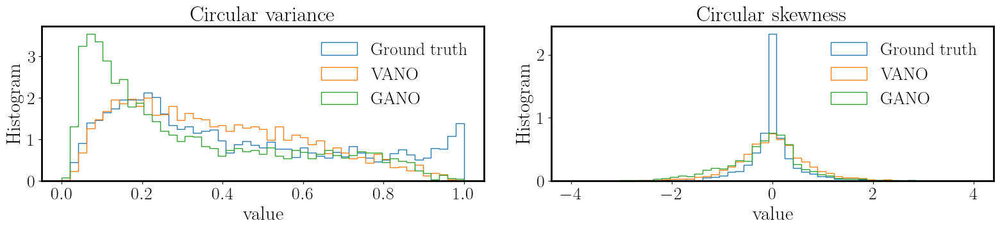

In [12]:
# Compute metrics
var_true = circular_var(volcano_data)
skew_true = circular_skew(volcano_data)

var_vano = circular_var(vano_samples)
skew_vano = circular_skew(vano_samples)

var_gano = circular_var(gano_samples)
skew_gano = circular_skew(gano_samples)


plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
plt.hist(var_true, bins=jnp.linspace(0.0, 1.0, 50), histtype='step', density=True, label='Ground truth')
plt.hist(var_vano, bins=jnp.linspace(0.0, 1.0, 50), histtype='step', density=True, label='VANO')
plt.hist(var_gano, bins=jnp.linspace(0.0, 1.0, 50), histtype='step', density=True, label='GANO')
plt.legend(frameon=False)
plt.xlabel('value')
plt.title('Circular variance')
plt.ylabel('Histogram')
plt.subplot(1,2,2)
plt.hist(skew_true, bins=jnp.linspace(-4.0, 4.0, 50), histtype='step', density=True, label='Ground truth')
plt.hist(skew_vano, bins=jnp.linspace(-4.0, 4.0, 50), histtype='step', density=True, label='VANO')
plt.hist(skew_gano, bins=jnp.linspace(-4.0, 4.0, 50), histtype='step', density=True, label='GANO')
plt.legend(frameon=False)
plt.xlabel('value')
plt.title('Circular skewness')
plt.ylabel('Histogram')
plt.tight_layout()
plt.savefig('./figures/volcano_statistics.png', dpi=300)
plt.show()


In [13]:
def compute_mmd(X, Y):
    
    def MMD(X, Y, k):
        n = X.shape[0]
        m = Y.shape[0]
        kXX = k(X,X)
        kYY = k(Y,Y)
        kXY = k(X,Y)
        Xterm = 1./(n*(n-1))*jnp.sum(kXX)
        Yterm = 1./(m*(m-1))*jnp.sum(kYY)
        XYterm = 1./(n*m)*jnp.sum(kXY)
        return Xterm + Yterm - 2*XYterm

    dim = X.shape[1]**2
    # kernelfunc = lambda x, y, sigmasq: sigmasq * (1.0 + jnp.sqrt(3.0) * jnp.sqrt(jnp.dot(x-y, x-y)/dim)) * jnp.exp(-jnp.sqrt(3.0) * jnp.sqrt(jnp.dot(x-y, x-y)/dim))
    # kernelfunc = lambda x, y, sigmasq: sigmasq * jnp.exp(-jnp.sqrt(jnp.dot(x-y, x-y)/dim))
    kernelfunc = lambda x, y, sigmasq: jnp.exp(- 1./(2*sigmasq*dim) * jnp.dot(x-y, x-y))
    

    # Define sweep range and containers
    # sigmasqs = jnp.logspace(-2,2,100)
    sigmasqs = jnp.linspace(1e-2,20,256)
    def get_mmds(X, Y, sigmasq):
        kernel = lambda x, y: kernelfunc(x, y, sigmasq)
        k = vmap(vmap(kernel, in_axes=(None, 0)), in_axes=(0, None))
        mmd = MMD(X, Y, k)
        return mmd

    mmds = vmap(get_mmds, in_axes=(None,None,0))(X.reshape(num_samples,-1), 
                                                 Y.reshape(num_samples,-1),
                                                 sigmasqs)
    return mmds    

In [14]:
num_trials = 10
num_samples = 256
key = random.PRNGKey(0)

vano_mmds = []
gano_mmds = []
for i in trange(num_trials):
    key, subkey = random.split(key)
    idx = random.choice(subkey, N, (num_samples,), replace=False)
    vano_mmds.append(compute_mmd(volcano_data[idx,...], vano_samples[idx,...]))
    gano_mmds.append(compute_mmd(volcano_data[idx,...], gano_samples[idx,...]))

vano_mmds = jnp.array(vano_mmds)
gano_mmds = jnp.array(gano_mmds)

  0%|          | 0/10 [00:00<?, ?it/s]

In [15]:
print(vano_mmds.shape)

(10, 256)


In [16]:
print('VANO MMD: %e pm %e' % (vano_mmds.max(1).mean(), vano_mmds.max(1).std()))
print('GANO MMD: %e pm %e' % (gano_mmds.max(1).mean(), gano_mmds.max(1).std()))

VANO MMD: 6.814278e-02 pm 4.717178e-03
GANO MMD: 2.456993e-02 pm 1.967074e-03


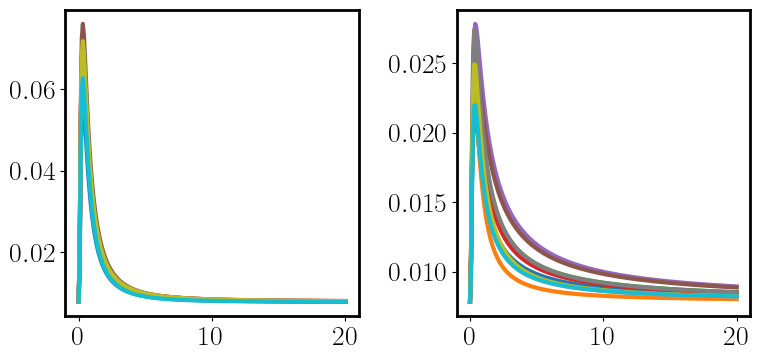

In [17]:
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.plot(jnp.linspace(1e-2,20,256), vano_mmds.T)
plt.subplot(1,2,2)
plt.plot(jnp.linspace(1e-2,20,256), gano_mmds.T)
plt.tight_layout()
plt.show()

In [18]:
num_trials = 10
num_samples = 256
key = random.PRNGKey(0)

volcano_mmds = []
for i in trange(num_trials):
    key, subkey = random.split(key)
    keys = random.split(subkey, 2)
    idx_1 = random.choice(keys[0], N, (num_samples,), replace=False)
    idx_2 = random.choice(keys[1], N, (num_samples,), replace=False)
    volcano_mmds.append(compute_mmd(volcano_data[idx_1,...], volcano_data[idx_2,...]))

volcano_mmds = jnp.array(volcano_mmds)

  0%|          | 0/10 [00:00<?, ?it/s]

In [19]:
print('Volcano MMD: %e pm %e' % (volcano_mmds.max(1).mean(), volcano_mmds.max(1).std()))


Volcano MMD: 8.252966e-03 pm 7.911373e-04
